## **Network stock portfolio optimization**
Yuejia Huang (yuejiahuang.com)

![Central vs peripheral stocks](https://live.staticflickr.com/65535/53565389938_c784ea3d7a_o.png)


**Overview**

Stock optimization is crucial in today's financial landscape, where market volatility can significantly impact investment returns. By efficiently allocating resources across a diversified portfolio, investors can mitigate risk and improve their investment outcomes.
This project aims to apply Network analysis technique on S&P 500 stocks from 2012 to 2022 to optimize investment portfolios. By examining the connectivity and centrality among stocks within the S&P 500 stocks, we build a **central** and **peripheral** portofios that work well in different market conditions.

**Modelling and performance evaluation**

We leveraged Network analysis techniques to build 2 portfolios based on centrality crtiria, each contains 15 stocks. We then compare them along with the S&P 500 Index under stable and uncertain market conditions.
The optimal portfolio is chosen by comparing **central** and **peripheral** portfolios.
   * Nodes with the largest 10% of degree or betweenness centrality are chosen to be in the central portfolio, and,
   * nodes whose degree equals to 1 or betweenness centrality equals to 0 are chosen to be in the peripheral portfolio.
   * The central and peripheral portfolios represents two opposite side of correlation and agglomeration. Generally speaking, central stocks play a vital role in the market and impose strong influence on other stocks. While the correlations between peripheral stocks are weak and contain much more noise than central stocks. These two kinds of portfolios have their own features under different market conditions.


**Approach**

1. Collect the price data for all S&P 500 companies from 2012 to 2022 from Yahoo Finance.
2. Compute the log returns of those companies in the time range examined.
3. Compute the *correlation matrix* for the log returns.
4. Use Network Analysis, find the top central and peripheral stocks using the following centrality measures:
    * degree centrality,
    * betweenness centrality,
    * distance on degree criterion,
    * distance on correlation criterion,
    * distance on distance criterion.
5. Simulate the performance of central and peripheral portfolios against the performance of S&P 500 Index in different market conditions (uncertain and risky market in 2021 and 2023, and stably growing market in 2017).

In [1]:
#operational
import pandas as pd
import numpy as np
import tqdm
import requests
import datetime as dt
import os

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#data extraction
from bs4 import BeautifulSoup
from pandas_datareader import data as pdr
import yfinance as yf

#network analysis
import networkx as nx

import warnings
warnings.filterwarnings('ignore')


**Data collection**

In [2]:
#use BeautifulSoup to get S&P 500 company names from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
page = requests.get(url)
soup = BeautifulSoup(page.text, 'html')

In [3]:
table = soup.find('table', {'class': 'wikitable sortable'})
tickers = []

for row in table.findAll('tr')[1:]:
    ticker = row.findAll('td')[0].text.strip('\n')
    tickers.append(ticker)

tickers = [ticker.replace('.', '-') for ticker in tickers]

In [4]:
#get daily adjusted price from Yahoo Finance
start_date = dt.datetime(2012, 1, 1)
end_date = dt.datetime(2022,12,31)

yf.pdr_override()
df = pdr.get_data_yahoo(tickers, start_date, end_date)

price = df[('Adj Close', )]
price.head()

[*********************100%%**********************]  503 of 503 completed

2 Failed downloads:
['KVUE', 'VLTO']: Exception("%ticker%: Data doesn't exist for startDate = 1325394000, endDate = 1672462800")


Ticker,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-03,23.490456,4.826837,12.433825,NaN,NaN,21.276014,12.493333,42.303040,28.570000,27.216066,...,84.649750,18.461151,52.614300,32.180920,21.305159,33.329353,47.348869,35.720001,13.245217,NaN
2012-01-04,23.303722,4.741991,12.500648,NaN,NaN,21.193493,12.266667,42.287056,28.280001,27.178303,...,83.193985,18.339603,52.626537,32.171814,22.008547,33.556973,46.708084,35.450001,13.537447,NaN
2012-01-05,23.825296,5.156796,12.639428,NaN,NaN,21.144726,12.500000,41.480148,28.480000,27.299162,...,82.324997,18.420641,52.467480,32.199085,21.694988,33.813042,47.261089,35.400002,13.916562,NaN
2012-01-06,24.082869,5.279352,12.771562,NaN,NaN,20.953424,12.486667,41.408241,28.719999,27.117870,...,79.428322,18.366625,52.075939,32.008064,21.330582,34.057747,47.383976,35.110001,13.932357,NaN
2012-01-09,24.713913,5.392481,12.751299,NaN,NaN,20.949671,12.396667,41.336338,28.530001,27.646631,...,79.205475,18.380123,52.308414,31.853451,21.415327,33.926857,47.735104,34.950001,14.121914,NaN


In [5]:
#save the dataset
price.to_csv('snp_500_2012_to_2022.csv')

In [6]:
#we collect the 2023 data as a test data
#get daily adjusted price from Yahoo Finance
start_date = dt.datetime(2023, 1, 1)
end_date = dt.datetime(2023,12,31)

yf.pdr_override()
df = pdr.get_data_yahoo(tickers, start_date, end_date)

test_price = df[('Adj Close', )]
test_price.head()

[*********************100%%**********************]  503 of 503 completed


Ticker,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-03,148.957687,12.74,124.216301,154.597824,84.900002,106.914360,62.459999,265.065399,336.920013,159.414185,...,84.742332,67.752022,102.045219,32.193272,109.020004,123.994759,126.299927,260.200012,45.668648,145.193253
2023-01-04,150.575928,13.59,125.497498,155.845032,88.720001,108.504700,62.770000,264.163086,341.410004,162.809555,...,89.978706,68.332176,102.342216,33.266708,108.852669,125.674568,127.470848,262.989990,47.336693,147.279449
2023-01-05,151.012756,13.99,124.166649,155.654602,87.709999,108.104675,62.939999,257.925323,328.440002,156.705780,...,90.414246,66.949478,104.632027,32.587196,105.762001,124.717461,125.109177,260.059998,46.507385,143.809052
2023-01-06,146.604782,14.18,128.735245,158.567963,88.519997,109.597466,63.900002,264.035583,332.750000,162.426834,...,92.621651,68.931671,105.896690,32.922028,109.521988,127.246948,124.732094,273.420013,48.307358,145.974335
2023-01-09,146.406235,14.61,129.261612,153.912308,89.239998,109.421837,62.669998,268.488312,341.980011,163.977310,...,93.373947,69.598846,103.923042,32.488716,110.033821,126.729347,125.079399,279.290009,48.081188,145.400879


In [7]:
#save test dataset for performance evaluation 
test_price.to_csv('snp_500_2023.csv')

**EDA**

In [8]:
price.head()

Ticker,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2012-01-03,23.490456,4.826837,12.433825,NaN,NaN,21.276014,12.493333,42.303040,28.570000,27.216066,...,84.649750,18.461151,52.614300,32.180920,21.305159,33.329353,47.348869,35.720001,13.245217,NaN
2012-01-04,23.303722,4.741991,12.500648,NaN,NaN,21.193493,12.266667,42.287056,28.280001,27.178303,...,83.193985,18.339603,52.626537,32.171814,22.008547,33.556973,46.708084,35.450001,13.537447,NaN
2012-01-05,23.825296,5.156796,12.639428,NaN,NaN,21.144726,12.500000,41.480148,28.480000,27.299162,...,82.324997,18.420641,52.467480,32.199085,21.694988,33.813042,47.261089,35.400002,13.916562,NaN
2012-01-06,24.082869,5.279352,12.771562,NaN,NaN,20.953424,12.486667,41.408241,28.719999,27.117870,...,79.428322,18.366625,52.075939,32.008064,21.330582,34.057747,47.383976,35.110001,13.932357,NaN
2012-01-09,24.713913,5.392481,12.751299,NaN,NaN,20.949671,12.396667,41.336338,28.530001,27.646631,...,79.205475,18.380123,52.308414,31.853451,21.415327,33.926857,47.735104,34.950001,14.121914,NaN


In [9]:
price.shape

(2768, 503)

In [10]:
price.isna().sum()

Ticker
A          0
AAL        0
AAPL       0
ABBV     250
ABNB    2250
        ... 
YUM        0
ZBH        0
ZBRA       0
ZION       0
ZTS      271
Length: 503, dtype: int64

The dataset contains 503 companies listed in S&P 500 Index from 2012 to 2022. There are some missing data since some stocks are added and some are removed from the list over the time. The following visualization shows missing data in some stocks. To get a better analysis result, we need to remove those stocks.

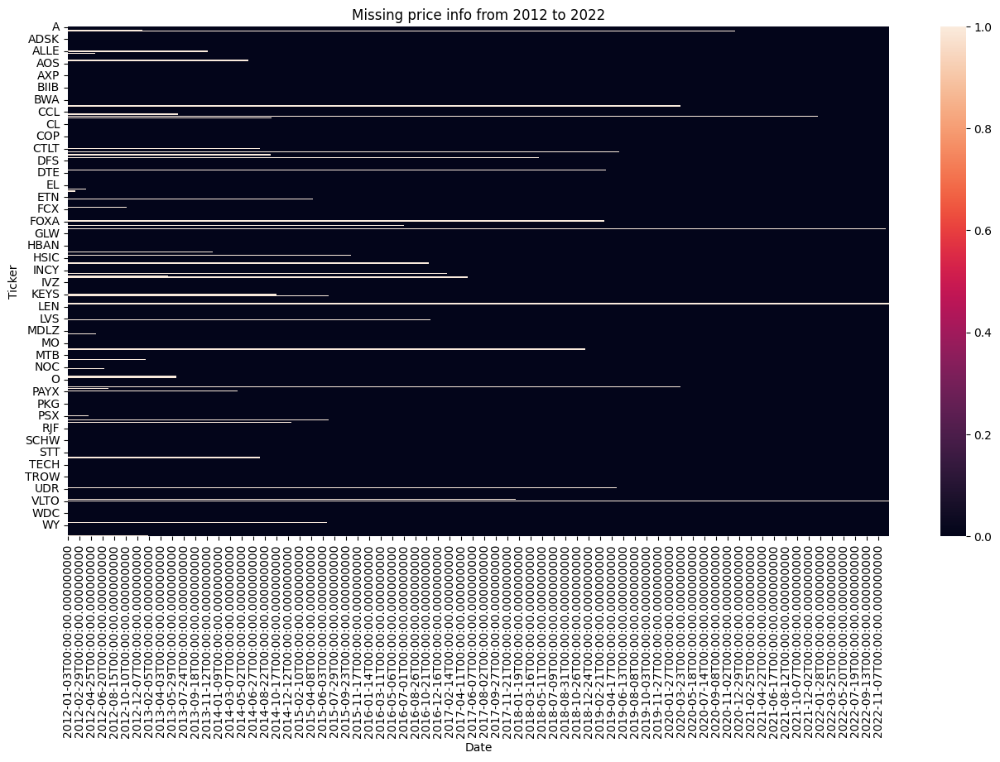

In [11]:
figure = plt.figure(figsize = (16, 8))
sns.heatmap(price.T.isnull())

plt.title('Missing price info from 2012 to 2022')
plt.show()

In [12]:
#remove stocks with missing prices
price_cleaned = price.dropna(axis = 1)

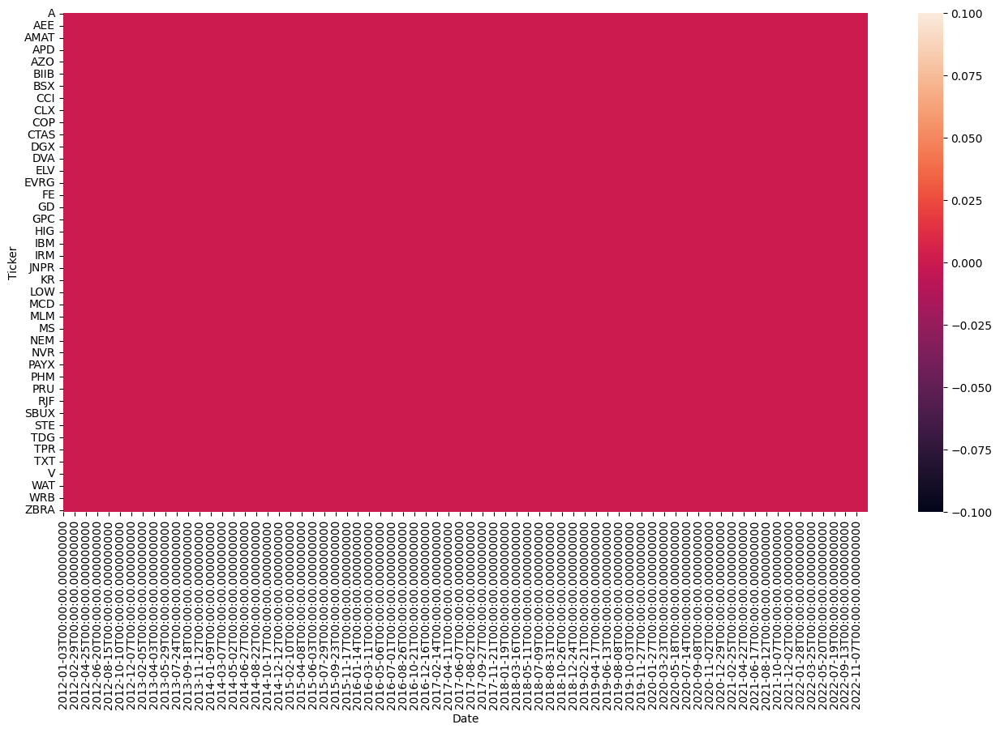

In [13]:
#visualize to see if there is still missing value
figure = plt.figure(figsize = (16, 8))
sns.heatmap(price_cleaned.T.isnull())

plt.show()

Missing values are removed. 

We now split the dataset into annual subsets.

In [14]:
def annual_data(data, year):
    annual_snp_data = data.loc['{}-01-01'.format(year): '{}-12-31'.format(year)]

    return annual_snp_data

In [15]:
#get subsets for each year
data_2012 = annual_data(price_cleaned, 2012)
data_2013 = annual_data(price_cleaned, 2013)
data_2014 = annual_data(price_cleaned, 2014)
data_2015 = annual_data(price_cleaned, 2015)
data_2016 = annual_data(price_cleaned, 2016)
data_2017 = annual_data(price_cleaned, 2017)
data_2018 = annual_data(price_cleaned, 2018)
data_2019 = annual_data(price_cleaned, 2019)
data_2020 = annual_data(price_cleaned, 2020)
data_2021 = annual_data(price_cleaned, 2021)
data_2022 = annual_data(price_cleaned, 2022)


Log returns are common ways to measure investment performance. Log returns are the logarithmic difference between the value of the asset at two different times. Essentially, they measure the percentage change of the value of the investment over time. To continue our network analysis on investment return, we need to calculate the log returns and then construct an adjacency matrix.

In [16]:
log_return_2012 = np.log(data_2012.shift(1)) - np.log(data_2012)
log_return_2013 = np.log(data_2013.shift(1)) - np.log(data_2013)
log_return_2014 = np.log(data_2014.shift(1)) - np.log(data_2014)
log_return_2015 = np.log(data_2015.shift(1)) - np.log(data_2015)
log_return_2016 = np.log(data_2016.shift(1)) - np.log(data_2016)
log_return_2017 = np.log(data_2017.shift(1)) - np.log(data_2017)
log_return_2018 = np.log(data_2018.shift(1)) - np.log(data_2018)
log_return_2019 = np.log(data_2019.shift(1)) - np.log(data_2019)
log_return_2020 = np.log(data_2020.shift(1)) - np.log(data_2020)
log_return_2021 = np.log(data_2021.shift(1)) - np.log(data_2021)
log_return_2022 = np.log(data_2022.shift(1)) - np.log(data_2022)

In [17]:
#construct adjacency matrix for network analysis
return_correlation_2012 = log_return_2012.corr()
return_correlation_2013 = log_return_2013.corr()
return_correlation_2014 = log_return_2014.corr()
return_correlation_2015 = log_return_2015.corr()
return_correlation_2016 = log_return_2016.corr()
return_correlation_2017 = log_return_2017.corr()
return_correlation_2018 = log_return_2018.corr()
return_correlation_2019 = log_return_2019.corr()
return_correlation_2020 = log_return_2020.corr()
return_correlation_2021 = log_return_2021.corr()
return_correlation_2022 = log_return_2022.corr()

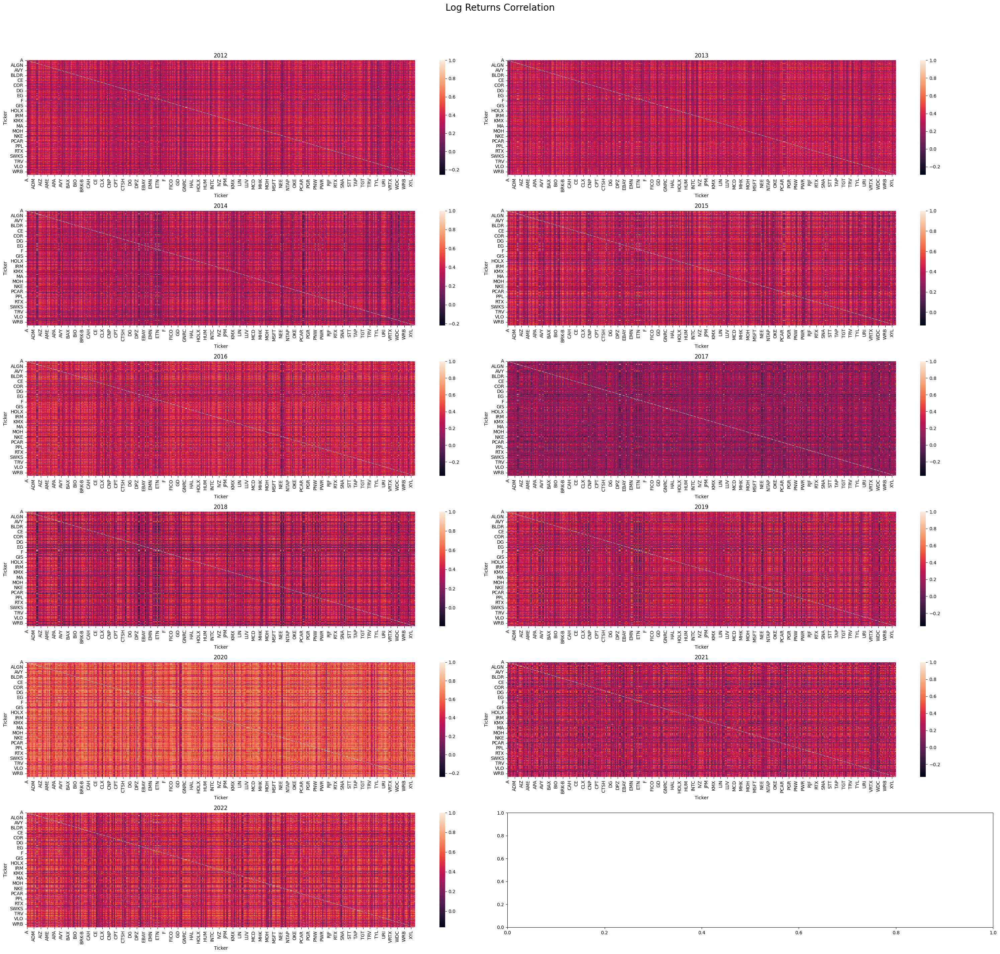

In [18]:
figure, axes = plt.subplots(6, 2, figsize=(30, 30))
figure.suptitle('Log Returns Correlation', fontsize=20)

years = range(2012, 2023)  # From 2012 to 2022
correlations = [
    return_correlation_2012, return_correlation_2013, return_correlation_2014,
    return_correlation_2015, return_correlation_2016, return_correlation_2017,
    return_correlation_2018, return_correlation_2019, return_correlation_2020,
    return_correlation_2021, return_correlation_2022]

for i, year in enumerate(years):
    ax = axes[i//2, i%2]
    sns.heatmap(correlations[i], ax=ax)
    ax.set_title(str(year))

# Adjust layout to make room for the figure suptitle
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()


Few observations from the heatmaps:
* The stock market was more volatile in 2012, 2014, 2015, 2016 and 2018. The stock log returns were more negatively correlated.
* In the years 2013, 2017, 2019 and 2021 where there was less volatility and more overall growth, the stock log returns were less correlated.
* In 2020, stock log returns were more correlated, it indicates that the stock prices went up or down along together due to the COVID-19 pandemic and uncertainty.
* In 2022, stock log returns were more correlated as the inflation problem was prevalent globally leading uncertainty in the stock market.

**Network construction**

I our stock portfolio optimization case, we design the network using a minimum spanning tree (MST) to eliminate the redundancies and noise while keeping significant connections in the network: if we construct a fully connected network, it looks like a messy hairball and thus is hard for us |to examine the connections among stocks and identify those with better returns.

An MST is a subset of the edges of a connected, edge-weighted undirected graph that connects all the vertices together, without any cycles and with the minimum possible total edge weight. In the context of a "spanning tree", the term "spanning" refers to the tree's ability to cover or "span" all the vertices in the graph without necessarily including all the edges. A spanning tree of a graph is a subset of the graph that includes all the vertices with the minimum number of edges needed to maintain the graph's connectedness. This means every vertex in the graph is included in the tree, and there is a path between any pair of vertices, ensuring the graph remains connected. However, to avoid cycles and maintain the tree structure (where each pair of vertices is connected by exactly one path), some edges of the original graph may not be included in the spanning tree if including them would create a cycle or if they are not necessary for maintaining the connected structure.

In [19]:
distance_2012 = np.sqrt(2 * (1 - return_correlation_2012))
distance_2013 = np.sqrt(2 * (1 - return_correlation_2013))
distance_2014 = np.sqrt(2 * (1 - return_correlation_2014))
distance_2015 = np.sqrt(2 * (1 - return_correlation_2015))
distance_2016 = np.sqrt(2 * (1 - return_correlation_2016))
distance_2017 = np.sqrt(2 * (1 - return_correlation_2017))
distance_2018 = np.sqrt(2 * (1 - return_correlation_2018))
distance_2019 = np.sqrt(2 * (1 - return_correlation_2019))
distance_2020 = np.sqrt(2 * (1 - return_correlation_2020))
distance_2021 = np.sqrt(2 * (1 - return_correlation_2021))
distance_2022 = np.sqrt(2 * (1 - return_correlation_2022))

Before the construction of MST graph, the correlation coefficient is converted into a distance.

In [20]:
distance_2012_graph = nx.Graph(distance_2012)
distance_2013_graph = nx.Graph(distance_2013)
distance_2014_graph = nx.Graph(distance_2014)
distance_2015_graph = nx.Graph(distance_2015)
distance_2016_graph = nx.Graph(distance_2016)
distance_2017_graph = nx.Graph(distance_2017)
distance_2018_graph = nx.Graph(distance_2018)
distance_2019_graph = nx.Graph(distance_2019)
distance_2020_graph = nx.Graph(distance_2020)
distance_2021_graph = nx.Graph(distance_2021)
distance_2022_graph = nx.Graph(distance_2022)

In [21]:
#construct a MST
graph_2012 = nx.minimum_spanning_tree(distance_2012_graph)
graph_2013 = nx.minimum_spanning_tree(distance_2013_graph)
graph_2014 = nx.minimum_spanning_tree(distance_2014_graph)
graph_2015 = nx.minimum_spanning_tree(distance_2015_graph)
graph_2016 = nx.minimum_spanning_tree(distance_2016_graph)
graph_2017 = nx.minimum_spanning_tree(distance_2017_graph)
graph_2018 = nx.minimum_spanning_tree(distance_2018_graph)
graph_2019 = nx.minimum_spanning_tree(distance_2019_graph)
graph_2020 = nx.minimum_spanning_tree(distance_2020_graph)
graph_2021 = nx.minimum_spanning_tree(distance_2021_graph)
graph_2022 = nx.minimum_spanning_tree(distance_2022_graph)

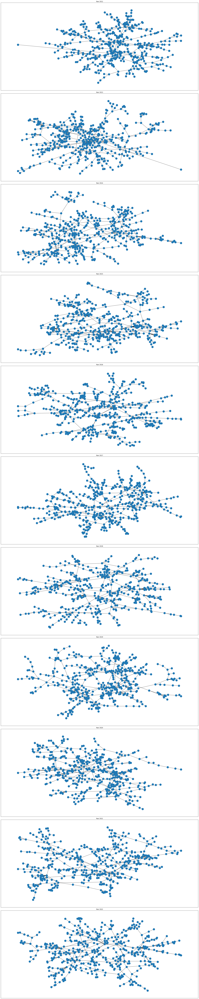

In [22]:
#plot
figure, axes = plt.subplots(11, 1, figsize=(24, 120))

years = range(2012, 2023)

graphs = {
    2012: graph_2012,
    2013: graph_2013,
    2014: graph_2014,
    2015: graph_2015,
    2016: graph_2016,
    2017: graph_2017,
    2018: graph_2018,
    2019: graph_2019,
    2020: graph_2020,
    2021: graph_2021,
    2022: graph_2022
}

for year, ax in zip(years, axes):
    nx.draw_networkx(graphs[year], with_labels=False, ax=ax)
    ax.set_title(f"Year {year}")  # Set the title for each subplot

plt.tight_layout()
plt.show()


The network looks different every year, and no two networks share the same pattern.

In [23]:
average_degree_connectivity = []
average_shortest_path_length = []
year = [2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

for graph in [graph_2012, 
              graph_2013, 
              graph_2014, 
              graph_2015, 
              graph_2016,
              graph_2017, 
              graph_2018,
              graph_2019,
              graph_2020,
              graph_2021,
              graph_2022]:
    average_shortest_path_length.append(nx.average_shortest_path_length(graph))

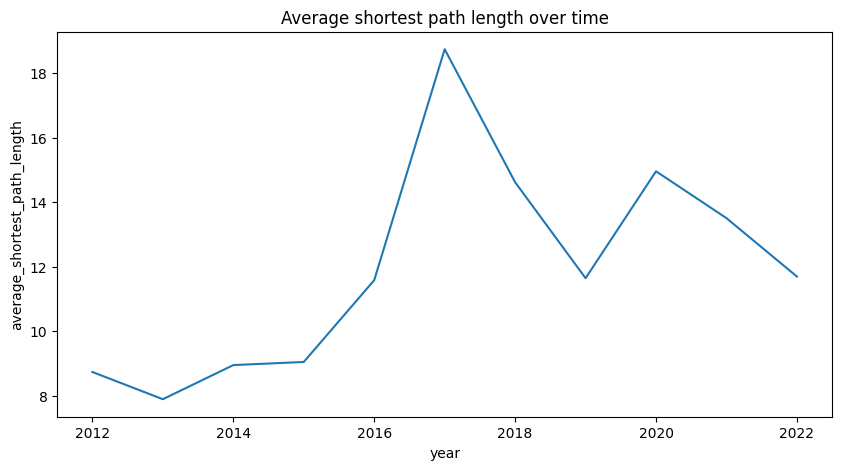

In [24]:
figure = plt.figure(figsize = (10, 5))
sns.lineplot(x = 'year', y = 'average_shortest_path_length',
             data = pd.DataFrame({'year': year, 'average_shortest_path_length': average_shortest_path_length}))

plt.title('Average shortest path length over time')
plt.show()

We show the change in average shortest path length from one stock to another stock in the MST network over time:

* From 2012 to 2015 when the market was more volatile, stocks were connected closely and the networks look more like a hairball. It takes less connections between two stocks.
* In 2017, the average shortest path length was the largest, showing stocks are more disparse and it takes more nodes to connect two stocks.

**Portfolio optimization using centrality measures**

In this section, we use log returns of enlisted companies combined from 2012 to 2022. The optimized portolio strategy is chosen using centrality measures: 
* degree centrality: it defines the relative significance of a stock in terms of number of edges (connections) on it. A stock with a high degree centrality has an impact on other stocks which are directly connected to it (e.g. "Magic 7" v.s. other tech companies);
* closeness centrality: it measures how close a node is to all other nodes in the network, based on the shortest paths. For a stock, this would indicate how closely or directly its movements are related to all other stocks in the network (e.g. Microsoft v.s. all other stocks);
* betweenness centrality: it quantifies the number of times a node acts as a bridge along the shortest path between two other nodes. For stocks, a high betweenness centrality indicates a stock that serves as a critical intermediary or connector between different market segments (e.g.Telsa can be a key influencer connecting other companies to the rest in different industries);
* eigenvector centrality: considers not just the number of connections a node has, but also the quality of those connections. In the stock market, a stock with high eigenvector centrality is connected to other stocks that themselves are central or highly connected (e.g.Google is not only an influential company itself, but also connected to other influentials).

In [25]:
#construct a MST for all company log returns in 2012-2022
log_returns_all = np.log(price_cleaned.shift(1)) - np.log(price_cleaned)
return_correlation_all = log_returns_all.corr()

In [26]:
distance_all = np.sqrt(2 * (1 - return_correlation_all))
distance_all_graph = nx.Graph(distance_all)
graph_all = nx.minimum_spanning_tree(distance_all_graph)

Previously, we discovered that stocks' correlation and average shortest path length in the network changed over the years. To better preserve this feature, we use the Kamada-Kawai layout algorithm in plotting the network. This algorithm tries to position nodes in such a way that the geometric distances between pairs of nodes are as close as possible to the graph-theoretical distances (shortest path distances in the graph). It is particularly good for drawing larger graphs in a way that visually represents the structure of the graph and minimizes edge crossings.

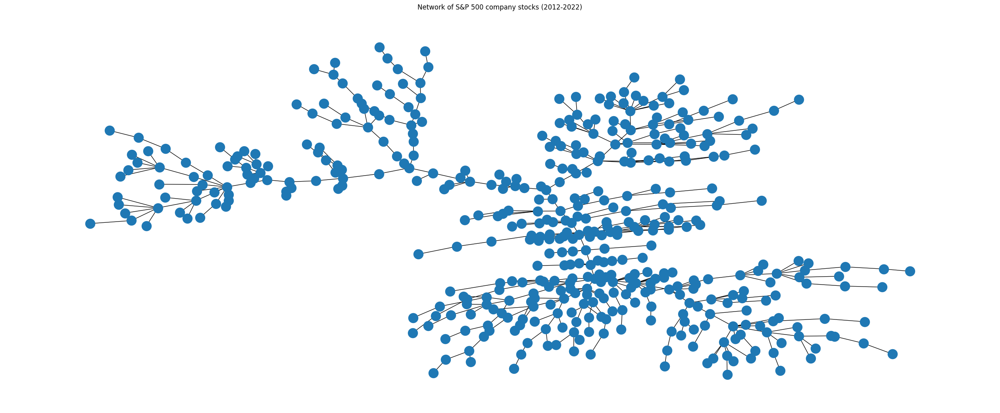

In [27]:
#plot the network of aggregate log returns over time
figure = plt.figure(figsize=(25, 10))
nx.draw_kamada_kawai(graph_all, with_labels=False)

plt.title('Network of S&P 500 company stocks (2012-2022)')
plt.show()

In [28]:
#calculate centrality measures
degree_centrality = nx.degree_centrality(graph_all)
closeness_centrality = nx.closeness_centrality(graph_all)
betweenness_centrality = nx.betweenness_centrality(graph_all)
eigenvector_centrality = nx.eigenvector_centrality_numpy(graph_all)


In [29]:
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'degree_centrality': values}).sort_values('degree_centrality', ascending=False)
px.bar(data_frame=dc_data, x='stocks', y='degree_centrality')

**Degree centrality** measures the number of direct connections a node has. In the stock market context, a stock with high degree centrality is directly correlated with many other stocks.

**AMP** (Ameriprise Financial, Inc.) has the highest degree centrality score with most edges: it's a diversified financial service company and probably serves many companies in different industries.

In [30]:
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality', 
                                                                                       ascending=False)
px.bar(data_frame=cc_data, x='stocks', y='closeness_centrality')

**Closeness centrality** measures how close a node is to all other nodes in the network, based on the shortest paths. In the stock market, a stock with high closeness centrality can quickly affect or be affected by any other stock through its direct or indirect connections.

**PRU** (Prudential Financial Inc.) has the highest closeness centrality score: it's also a large-scale financial service company that can influence any other stocks directly or indirectly.

In [31]:
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality', 
                                                                                       ascending=False)
px.bar(data_frame=bc_data, x='stocks', y='betweenness_centrality')

**Betweenness centrality** quantifies the number of times a node acts as a bridge along the shortest path between two other nodes. For stocks, a high betweenness centrality indicates a stock that serves as a critical intermediary or connector between different market segments.

**TFC** (Truist Financial Corp.) has the highest betweenness centrality: as a banking holding company, it plays a significant role in coordinating information in different industries.

In [32]:
keys = []
values = []

for key, value in eigenvector_centrality.items():
    keys.append(key)
    values.append(value)

ec_data = pd.DataFrame({'stocks': keys, 'eigenvector_centrality': values}).sort_values('eigenvector_centrality', ascending=False)
px.bar(data_frame=ec_data, x='stocks', y='eigenvector_centrality')

**Eigenvector centrality** considers not just the number of connections a node has, but also the quality of those connections. In the stock market, a stock with high eigenvector centrality is connected to other stocks that themselves are central or highly connected.

**AMP** (Ameriprise Financial Inc.) has the highest eigenvector centrality score, suggesting it is not only a siginificant player but has connections with other big players.

**Portfolio strategy**

A portfolio strategy comprises two stages:
1. selecting the portfolios by choosing central and peripheral stocks in the selection horizon using five topological parameters, i.e., degree, betweenness centrality, distance on degree criterion, distance on correlation criterion and distance on distance criterion, then using the portfolios for investment in the investment horizon.
   * Previously, we calculated degree and betweenness centrality;
   * distance on degree: we choose the central node with largest degree centrality score;
   * distance on correlation: we choose the central node with highest value of summarized correlation coefficients with its neighbors;
   * distance on distance: we choose the central node with lowest mean distance.
  
2.  The optimal portfolio is chosen by comparing **central** and **peripheral** portfolios.
   * Nodes with the largest 10% of degree or betweenness centrality are chosen to be in the central portfolio, and
   * nodes whose degree equals to 1 or betweenness centrality equals to 0 are chosen to be in the peripheral portfolio.
   * The central and peripheral portfolios represents two opposite side of correlation and agglomeration. Generally speaking, central stocks play a vital role in the market and impose strong influence on other stocks. While the correlations between peripheral stocks are weak and contain much more noise than central stocks. These two kinds of portfolios have their own features under different market conditions.

In [33]:
#distance on degree criterion
distance_degree_criteria = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)
for node in graph_all.nodes():
    distance_degree_criteria[node] = nx.shortest_path_length(graph_all, node, node_with_largest_degree_centrality)

In [34]:
#distance on correlation criterion
distance_correlation_criteria = {}
sum_correlation = {}

for node in graph_all.nodes():
    neighbors = nx.neighbors(graph_all, node)
    sum_correlation[node] = sum(return_correlation_all[node][neighbor] for neighbor in neighbors)

node_with_highest_correlation = max(sum_correlation, key=sum_correlation.get)
    
for node in graph_all.nodes(): distance_correlation_criteria[node] = nx.shortest_path_length(graph_all, node, node_with_highest_correlation) 

In [35]:
#distance on distance criterion
distance_distance_criteria = {}
mean_distance = {}

for node in graph_all.nodes():
    nodes = list(graph_all.nodes())
    nodes.remove(node)
    distance_distance = [nx.shortest_path_length(graph_all, node, ns) for ns in nodes]
    mean_distance[node] = np.mean(distance_distance)
    
node_with_minimum_mean_distance = min(mean_distance, key=mean_distance.get)

for node in graph_all.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(graph_all,node, node_with_minimum_mean_distance)

In [36]:
#create a dataframe containing performance measures
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
node_stats['betweenness_centrality'] = betweenness_centrality.values()
#average of degree and betweenness centrality
node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])

node_stats['distance_degree_criteria'] = distance_degree_criteria.values()
node_stats['distance_correlation_criteria'] = distance_correlation_criteria.values()
node_stats['distance_distance_criteria'] = distance_distance_criteria.values()
#average of 3 criteria
node_stats['average_distance'] = (node_stats['distance_degree_criteria'] + node_stats['distance_correlation_criteria'] +
                                  node_stats['distance_distance_criteria']) / 3

In [37]:
node_stats.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
A,0.011062,0.064694,0.037878,7,7,8,7.333333
AAL,0.002212,0.000000,0.001106,18,18,17,17.666667
AAPL,0.002212,0.000000,0.001106,11,11,12,11.333333
ABT,0.004425,0.008830,0.006627,9,9,10,9.333333
ACGL,0.004425,0.004425,0.004425,4,4,3,3.666667


**Pick 15 stocks for central and peripheral portfolios**

In [38]:
#central portfolio contains nodes with the largest 10% degree of betweenness centrality
central_stocks = node_stats.sort_values('average_centrality', ascending = False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values]

central_stocks.index

Index(['AMP', 'PH', 'TFC', 'PRU', 'GL', 'ETN', 'AME', 'USB', 'FITB', 'DFS',
       'FRT', 'COF', 'SPG', 'TEL', 'JPM'],
      dtype='object')

The 15 central stocks are:
* AMP: Ameriprise Financial, Inc. - Industry: Financial Services
* PH: Parker-Hannifin Corporation - Industry: Industrial Machinery
* TFC: Truist Financial Corporation (formerly BB&T and SunTrust) - Industry: Banking and Financial Services
* PRU: Prudential Financial, Inc. - Industry: Insurance and Financial Services
* GL: Globe Life Inc. - Industry: Insurance
* ETN: Eaton Corporation plc - Industry: Power Management
* AME: AMETEK, Inc. - Industry: Electronic Instruments and Electromechanical Devices
* USB: U.S. Bancorp - Industry: Banking and Financial Services
* FITB: Fifth Third Bancorp - Industry: Banking and Financial Services
* DFS: Discover Financial Services - Industry: Financial Services
* FRT: Federal Realty Investment Trust - Industry: Real Estate Investment Trust (REIT)
* COF: Capital One Financial Corporation - Industry: Financial Services
* SPG: Simon Property Group, Inc. - Industry: Real Estate Investment Trust (REIT)
* TEL: TE Connectivity Ltd. - Industry: Technology and Electronics
* JPM: JPMorgan Chase & Co. - Industry: Banking and Financial Services

The majority are large-scale financial servives/banking companies. Due to their nature, it makes sense for them to have tight connection with many other companies across industries. When the economy is growing, the financial industry is most likely benefited from enterprise expansion.

In [39]:
#peripheral portfolios with 15 stocks
peripheral_stocks = node_stats.sort_values('average_distance', ascending = False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values]

peripheral_stocks.index

Index(['CHD', 'CLX', 'SBAC', 'INCY', 'SJM', 'AAL', 'BMY', 'CAG', 'CCI', 'VRTX',
       'CPB', 'EQIX', 'REGN', 'GILD', 'HRL'],
      dtype='object')

The 15 peripheral stocks are:
* CHD: Church & Dwight Co., Inc. - Industry: Consumer Goods (Household Products)
* CLX: The Clorox Company - Industry: Consumer Goods (Household & Personal Products)
* SBAC: SBA Communications Corporation - Industry: Real Estate (Wireless Communication Towers REIT)
* INCY: Incyte Corporation - Industry: Biopharmaceuticals
* SJM: The J.M. Smucker Company - Industry: Food Processing
* AAL: American Airlines Group Inc. - Industry: Airlines
* BMY: Bristol-Myers Squibb Company - Industry: Pharmaceuticals
* CAG: Conagra Brands, Inc. - Industry: Packaged Foods and Meats
* CCI: Crown Castle International Corp. - Industry: Telecommunications (REIT)
* VRTX: Vertex Pharmaceuticals Incorporated - Industry: Biotechnology
* CPB: Campbell Soup Company - Industry: Packaged Foods and Meats
* EQIX: Equinix, Inc. - Industry: Real Estate (REIT, specializes in data center properties)
* REGN: Regeneron Pharmaceuticals, Inc. - Industry: Biotechnology
* GILD: Gilead Sciences, Inc. - Industry: Biopharmaceuticals
* HRL: Hormel Foods Corporation - Industry: Food Processing

Many of them are manufacturing/utility companies providing specific consumer products/service. When the macro environment is slow, they will easily be impacted.

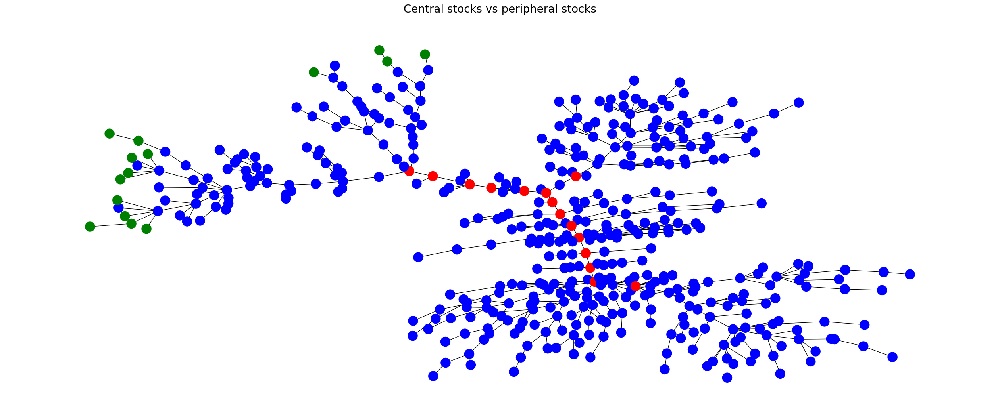

In [40]:
#visualization
color = []

for node in graph_all:
    if node in central_portfolio:
        color.append('red')
        
    elif node in peripheral_portfolio:
        color.append('green')
        
    else:
        color.append('blue')

#red nodes are central stocks, blue nodes are peripheral stocks.
figure = plt.figure(figsize = (25, 10))
nx.draw_kamada_kawai(graph_all, with_labels = False, node_color = color)

plt.title('Central stocks vs peripheral stocks', fontsize = 20)
plt.show()

**Performance Evaluation**

In this section, we include the S&P 500 Index in 2023 and evaluate the central and peripheral portfolios to check which one has a better performance.

In [41]:
test_price.head()

Ticker,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2023-01-03,148.957687,12.74,124.216301,154.597824,84.900002,106.914360,62.459999,265.065399,336.920013,159.414185,...,84.742332,67.752022,102.045219,32.193272,109.020004,123.994759,126.299927,260.200012,45.668648,145.193253
2023-01-04,150.575928,13.59,125.497498,155.845032,88.720001,108.504700,62.770000,264.163086,341.410004,162.809555,...,89.978706,68.332176,102.342216,33.266708,108.852669,125.674568,127.470848,262.989990,47.336693,147.279449
2023-01-05,151.012756,13.99,124.166649,155.654602,87.709999,108.104675,62.939999,257.925323,328.440002,156.705780,...,90.414246,66.949478,104.632027,32.587196,105.762001,124.717461,125.109177,260.059998,46.507385,143.809052
2023-01-06,146.604782,14.18,128.735245,158.567963,88.519997,109.597466,63.900002,264.035583,332.750000,162.426834,...,92.621651,68.931671,105.896690,32.922028,109.521988,127.246948,124.732094,273.420013,48.307358,145.974335
2023-01-09,146.406235,14.61,129.261612,153.912308,89.239998,109.421837,62.669998,268.488312,341.980011,163.977310,...,93.373947,69.598846,103.923042,32.488716,110.033821,126.729347,125.079399,279.290009,48.081188,145.400879


In [42]:
#remove missing values from 2023 S&P 500 stocks 
price_2023 = test_price.dropna(axis = 1)

In [43]:
#pull S&P 500 Index in 2023
sp500_2023 = yf.download (tickers = '^GSPC', start = '2023-01-01', end = '2023-12-31', interval = '1d')
sp500_2023 =sp500_2023['Adj Close']
sp500_2023

[*********************100%%**********************]  1 of 1 completed


Date
2023-01-03    3824.139893
2023-01-04    3852.969971
2023-01-05    3808.100098
2023-01-06    3895.080078
2023-01-09    3892.090088
                 ...     
2023-12-22    4754.629883
2023-12-26    4774.750000
2023-12-27    4781.580078
2023-12-28    4783.350098
2023-12-29    4769.830078
Name: Adj Close, Length: 250, dtype: float64

In [44]:
sp500_2023 = sp500_2023.dropna()

In [45]:

amount = 100000

central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = price_2023[stock]

portfolio_unit = central_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis = 1) * share

peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = price_2023[stock]

portfolio_unit = peripheral_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis = 1) * share



In [46]:
sp500_2023_value = sp500_2023 * (amount / sp500_2023.iloc[0])

In [47]:
all_portfolios = pd.concat([sp500_2023_value, central_portfolio_value, peripheral_portfolio_value], axis = 1)
all_portfolios.columns = ['sp500', 'central_portfolio', 'peripheral_portfolio']

In [48]:
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
Date,,,
2023-01-03,100000.000000,100000.000000,100000.000000
2023-01-04,100753.897058,101653.304303,101482.400145
2023-01-05,99580.564640,100563.098037,100342.489060
2023-01-06,101855.062512,103584.345357,102369.359331
2023-01-09,101776.875251,103233.011432,99846.258577


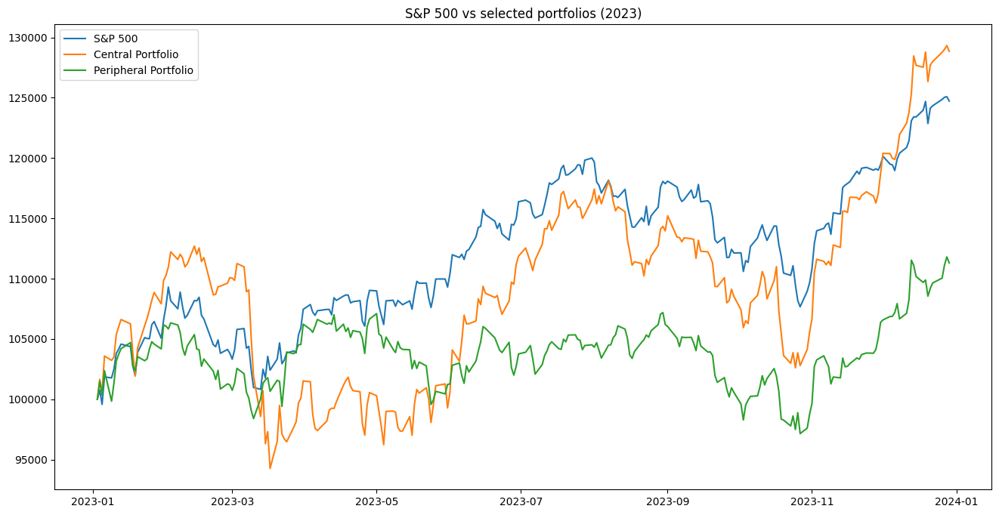

In [49]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')

plt.title('S&P 500 vs selected portfolios (2023)')
plt.show()

In [50]:
#pull S&P 500 Index in 2017
sp500_2017 = yf.download (tickers = '^GSPC', start = '2017-01-01', end = '2017-12-31', interval = '1d')
sp500_2017 =sp500_2017['Adj Close']
sp500_2017.dropna()

[*********************100%%**********************]  1 of 1 completed


Date
2017-01-03    2257.830078
2017-01-04    2270.750000
2017-01-05    2269.000000
2017-01-06    2276.979980
2017-01-09    2268.899902
                 ...     
2017-12-22    2683.340088
2017-12-26    2680.500000
2017-12-27    2682.620117
2017-12-28    2687.540039
2017-12-29    2673.610107
Name: Adj Close, Length: 251, dtype: float64

In [51]:
data_2017.head()

Ticker,A,AAL,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WY,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,44.047390,44.741226,26.989264,34.296658,28.629999,104.167435,103.480003,63.237144,37.710304,89.319771,...,22.694729,80.211433,33.062607,64.500023,54.809013,45.438732,55.535854,95.016685,86.250000,35.140804
2017-01-04,44.625343,45.127758,26.959057,34.568920,28.833332,104.417877,104.139999,63.106323,37.644993,89.457855,...,22.896563,82.797699,33.209110,63.790375,55.257805,46.115974,55.737930,95.890259,87.029999,35.645374
2017-01-05,44.094761,44.345028,27.096153,34.867535,28.540001,102.852570,105.910004,62.199348,37.367405,88.922798,...,23.135771,83.861565,33.209110,62.839424,54.537865,45.694992,55.922436,96.506332,84.750000,35.067562
2017-01-06,45.468578,44.654259,27.398230,35.816078,28.823334,104.024307,108.300003,62.443508,36.510174,88.983200,...,23.061016,84.769508,33.306789,62.803944,54.500454,45.374668,56.598957,96.515533,85.959999,35.295441
2017-01-09,45.610703,45.494968,27.649181,35.780945,28.406668,102.861549,108.570000,62.740047,36.534660,88.430908,...,23.150717,85.062996,32.802143,61.767860,54.668766,45.182476,56.757099,98.391418,85.970001,34.912941


In [52]:
amount = 100000

central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = data_2017[stock]

portfolio_unit = central_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis = 1) * share

peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = data_2017[stock]

portfolio_unit = peripheral_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis = 1) * share

In [53]:
sp500_2017_value = sp500_2017 * (amount / sp500_2017.iloc[0])

In [54]:
all_portfolios = pd.concat([sp500_2017_value, central_portfolio_value, peripheral_portfolio_value], axis = 1)
all_portfolios.columns = ['sp500', 'central_portfolio', 'peripheral_portfolio']
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
Date,,,
2017-01-03,100000.000000,100000.000000,100000.000000
2017-01-04,100572.227379,100891.717350,101043.219790
2017-01-05,100494.719332,99970.722158,101357.083113
2017-01-06,100848.155161,100489.806747,100024.573770
2017-01-09,100490.285975,99739.925736,100628.707518


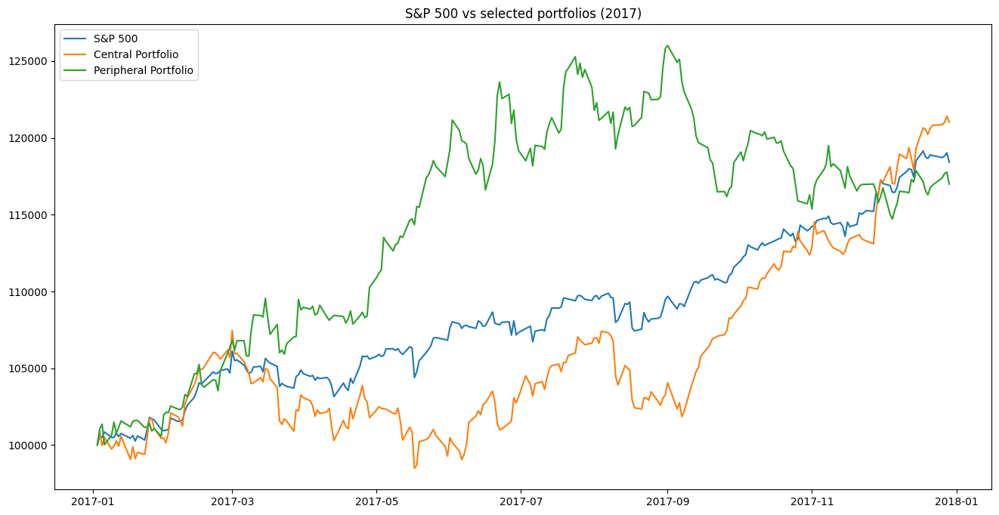

In [55]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')

plt.title('S&P 500 vs selected portfolios (2017)')
plt.show()

In [56]:
#pull S&P 500 Index in 2021
sp500_2021 = yf.download (tickers = '^GSPC', start = '2021-01-01', end = '2021-12-31', interval = '1d')
sp500_2021 =sp500_2021['Adj Close']
sp500_2021.dropna()

[*********************100%%**********************]  1 of 1 completed


Date
2021-01-04    3700.649902
2021-01-05    3726.860107
2021-01-06    3748.139893
2021-01-07    3803.790039
2021-01-08    3824.679932
                 ...     
2021-12-23    4725.790039
2021-12-27    4791.189941
2021-12-28    4786.350098
2021-12-29    4793.060059
2021-12-30    4778.729980
Name: Adj Close, Length: 251, dtype: float64

In [57]:
amount = 100000

central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = data_2021[stock]

portfolio_unit = central_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis = 1) * share

peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = data_2021[stock]

portfolio_unit = peripheral_portfolio_value.sum(axis = 1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis = 1) * share

In [58]:
sp500_2021_value = sp500_2021 * (amount / sp500_2021.iloc[0])

In [59]:
all_portfolios = pd.concat([sp500_2021_value, central_portfolio_value, peripheral_portfolio_value], axis = 1)
all_portfolios.columns = ['sp500', 'central_portfolio', 'peripheral_portfolio']
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
Date,,,
2021-01-04,100000.000000,100000.000000,100000.000000
2021-01-05,100708.259516,100994.453834,99831.182052
2021-01-06,101283.287841,105765.894010,97838.895632
2021-01-07,102787.081714,107010.850268,99028.659819
2021-01-08,103351.574252,106838.181973,100785.620462


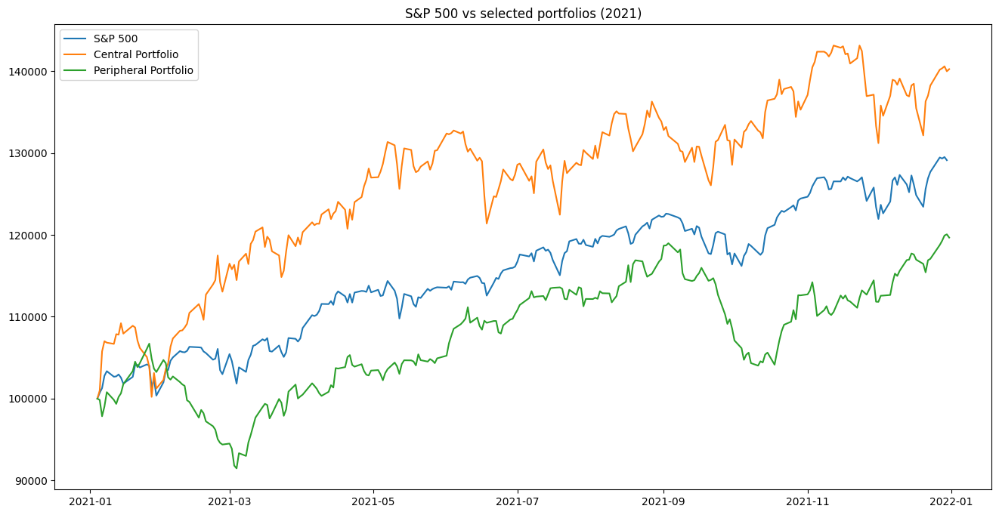

In [60]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')

plt.title('S&P 500 vs selected portfolios (2021)')
plt.show()

We tested performance of central and peripheral portfolios under different market conditions:
* In an uncertain market that is suffering from price inflation and high interest rates (in 2021 and 2023), the central portfolio performs better than the peripheral portfolio and can be used to hedge risks.
* In a stably growing market condition (in 2017), the peripheral portfolio performs better than the S&P 500 Index and the central portfolio. This is because te peripheral portfolio is consist of majorly consumer products manufacturers and utility providers. They are benifited from prosperous and expanding economic environments and outperform in the stock market.

**Conclusion**
* In stable years, the stock log returns are more negatively correlated whereas stock log returns are more correlated in crisis market conditions.
* Using a Network analysis, we build two portfolios based on individual stocks' connectivity and relations with others. The central portfolio is consist of mostly financial service providers. They have strong connections and plays a central role in coordinating capitals and information and it performs better in an unstable market and hedge risks.
* The peripheral portfolio stocks are mostly consumer products manufacturers and utility providers. They are less connected to other enlisted company stocks. They can be benefited from a growing economy where market demand is high and enterprises expand. Thus an investor can choose the peripheral portfolio in a stable and growing market condition.